<a href="https://colab.research.google.com/github/MYunan17/PCVK-Genap-25-26/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


 Mengubah tingkat kecerahan citra 
-----------------------------------
Masukkan nilai kecerahan: 50


/tmp/ipykernel_5104/698660237.py:18: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


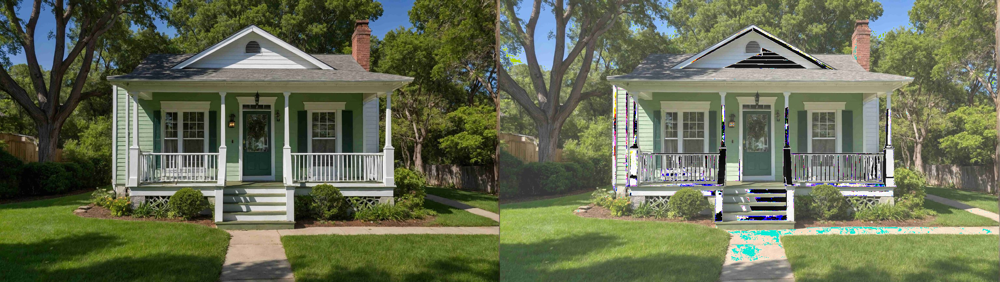

In [4]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra ')
print('-----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/rumah.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

TUGAS PRAKTIKUM

Tugas 1: Inverse Citra

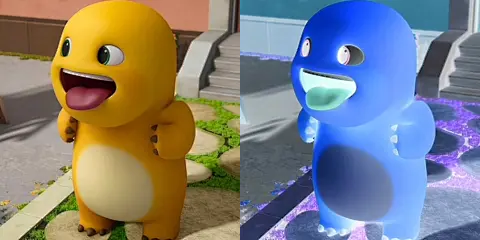

In [6]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('/content/nailong.webp')

inverse_img = 255 - img
cv2_imshow(cv.hconcat((img, inverse_img)))

Tugas 2: Transformasi Contrast

 Mengubah tingkat kecerahan citra 
-----------------------------------
Masukkan tingkat kecerahan: 10
Masukkan kontras: 1.5


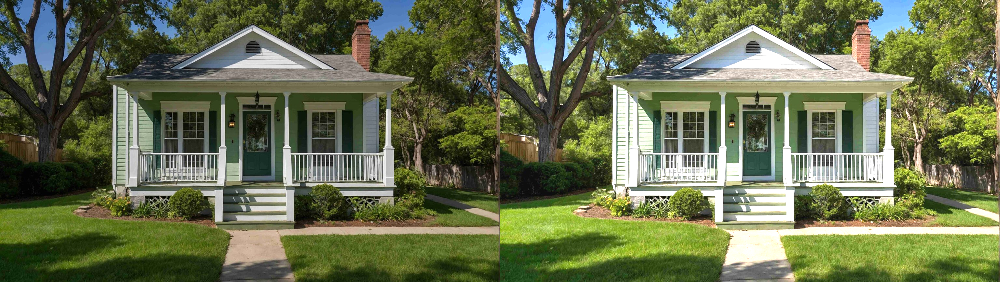

In [8]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra ')
print('-----------------------------------')
try:
    brightness = int(input('Masukkan tingkat kecerahan: '))
    contrast = float(input('Masukkan kontras: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/rumah.jpg')

contrast_img = np.clip(contrast * original.astype(np.float32) + brightness, 0, 255).astype(np.uint8)

final_frame = cv.hconcat((original, contrast_img))
cv2_imshow(final_frame)

Tugas 3: Transformasi Logarithmic Brightness

 Mengubah tingkat kecerahan citra dengan transformasi log 
-----------------------------------
Masukkan nilai kecerahan: 50


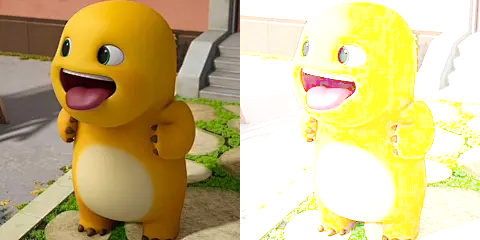

In [12]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra dengan transformasi log ')
print('-----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/spongebob.png')

img_float = img.astype(np.float32)

c = 255 / np.log(1 + np.max(img_float))
log_img = c * np.log(1 + img_float) + brightness

log_img = np.clip(log_img, 0, 255).astype(np.uint8)

cv2_imshow(cv.hconcat((img, log_img)))

Tugas 4: Operasi Grayscale

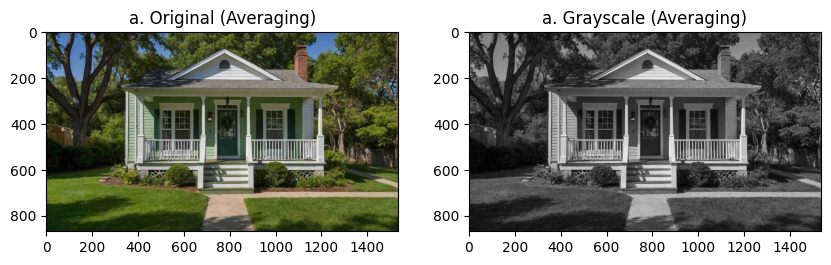

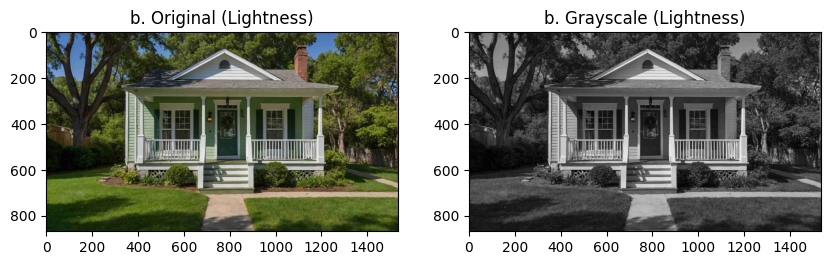

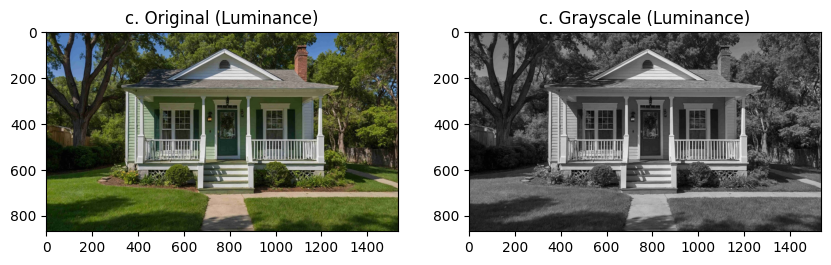

In [13]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_bgr = cv.imread('/content/rumah.jpg')
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

R = img_rgb[:, :, 0].astype(np.float32)
G = img_rgb[:, :, 1].astype(np.float32)
B = img_rgb[:, :, 2].astype(np.float32)

# a. Averaging
gray_avg = np.clip((R + G + B) / 3.0, 0, 255).astype(np.uint8)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('a. Original (Averaging)')

plt.subplot(1, 2, 2)
plt.imshow(gray_avg, cmap='gray')
plt.title('a. Grayscale (Averaging)')
plt.show()

# b. Lightness
max_channel = np.maximum(np.maximum(R, G), B)
min_channel = np.minimum(np.minimum(R, G), B)
gray_lightness = np.clip((max_channel + min_channel) / 2.0, 0, 255).astype(np.uint8)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('b. Original (Lightness)')

plt.subplot(1, 2, 2)
plt.imshow(gray_lightness, cmap='gray')
plt.title('b. Grayscale (Lightness)')
plt.show()

# c. Luminance
gray_luminance = np.clip(0.21 * R + 0.72 * G + 0.07 * B, 0, 255).astype(np.uint8)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('c. Original (Luminance)')

plt.subplot(1, 2, 2)
plt.imshow(gray_luminance, cmap='gray')
plt.title('c. Grayscale (Luminance)')
plt.show()

Tugas 5 : Menampilkan warna tertentu pada citran dan ubah warna lain menjadi grayscale.

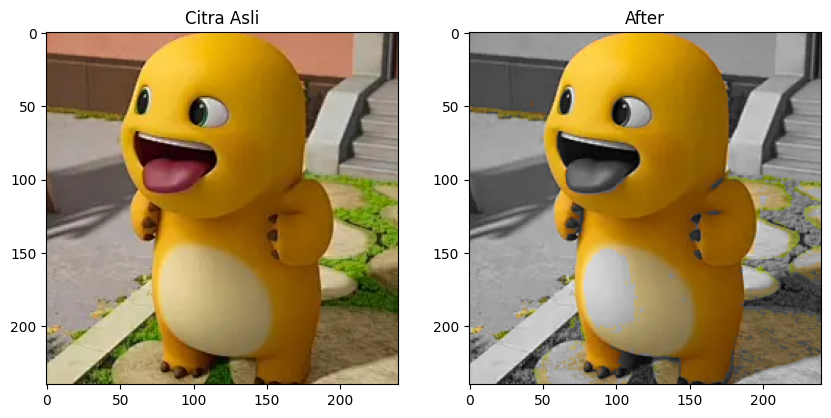

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_bgr = cv.imread('/content/nailong.webp')
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

hsv_img = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)

lower_yellow = np.array([15, 100, 100])
upper_yellow = np.array([35, 255, 255])

mask = cv.inRange(hsv_img, lower_yellow, upper_yellow)

gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)
gray_3ch = cv.cvtColor(gray, cv.COLOR_GRAY2RGB)

result_rgb = np.where(mask[:, :, np.newaxis] == 255, img_rgb, gray_3ch)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli')

plt.subplot(1, 2, 2)
plt.imshow(result_rgb)
plt.title('After')

plt.show()

Tugas 6 : Membuat Gamma Correction

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 0.5


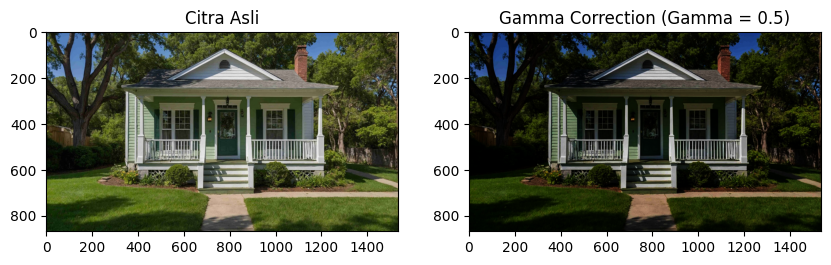

In [17]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

img_bgr = cv.imread('/content/rumah.jpg')
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

img_normalized = img_rgb / 255.0
gamma_corrected = np.power(img_normalized, 1.0 / gamma)

gamma_corrected = np.clip(gamma_corrected * 255.0, 0, 255).astype(np.uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli')

plt.subplot(1, 2, 2)
plt.imshow(gamma_corrected)
plt.title(f'Gamma Correction (Gamma = {gamma})')

plt.show()

Tugas 7 : Simulasi Image Depth

Masukkan bit depth tujuan (1-8): 3
Bit depth awal  : 8 bit
Bit depth tujuan: 3 bit
Jumlah level    : 8


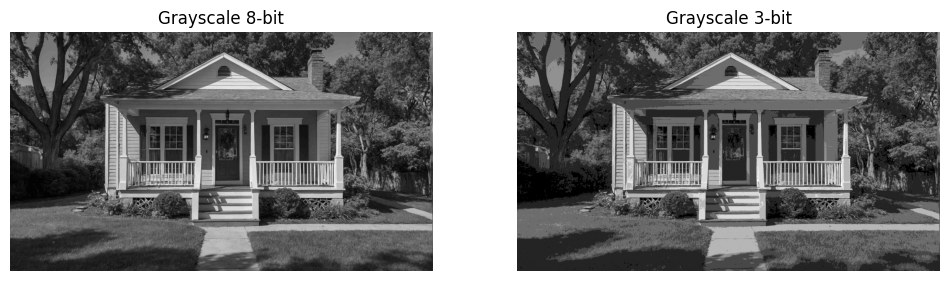

In [27]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

try:
    bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))

    if bit_depth < 1 or bit_depth > 8:
        print("Error: Harap masukkan angka antara 1 sampai 8!")
        bit_depth = 3 # Default jika diluar batas
except ValueError:
    print('Error, not a number!')
    bit_depth = 3

num_levels = pow(2, bit_depth)
print(f'Bit depth awal  : 8 bit')
print(f'Bit depth tujuan: {bit_depth} bit')
print(f'Jumlah level    : {num_levels}')

original = cv.imread('/content/rumah.jpg', cv.IMREAD_GRAYSCALE)

depth_image = np.zeros(original.shape, original.dtype)
level = 255.0 / (pow(2, bit_depth) - 1)
normalized = original.astype(np.float32) / level
quantized = np.round(normalized) * level
depth_image = (np.round(original / level) * level).astype(np.uint8)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(original, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale 8-bit')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(depth_image, cmap='gray', vmin=0, vmax=255)
plt.title(f'Grayscale {bit_depth}-bit')
plt.axis('off')

plt.show()

Tugas 8 : Modul Average Denoising

Jumlah Citra:  10 | PSNR: 11.55 dB
Peringatan: Jumlah gambar noise yang tersedia (11) kurang dari 20


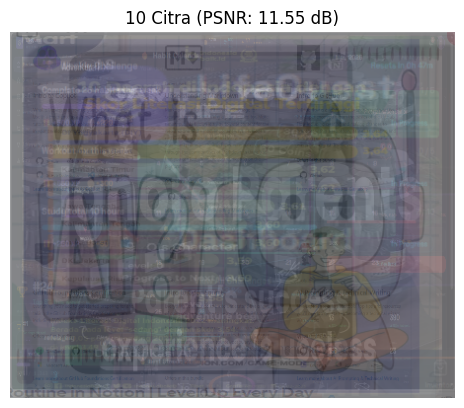

In [31]:
import cv2 as cv
import numpy as np
import glob
import matplotlib.pyplot as plt

original_path = '/content/Galaxy.jpg'
original = cv.imread(original_path)

noise_files = sorted(glob.glob('/content/*.png'))
noise_files = [f for f in noise_files if 'Galaxy.jpg' not in f]

cv_img = []
for img_path in noise_files:
    n = cv.imread(img_path)
    if n is not None:
        if n.shape != original.shape:
            n = cv.resize(n, (original.shape[1], original.shape[0]))
        cv_img.append(n)

def average_denoising(images_list, count):
    selected_imgs = images_list[:count]

    acc = np.zeros_like(selected_imgs[0], dtype=np.float32)
    for img in selected_imgs:
        acc += img.astype(np.float32)

    avg_img = acc / count
    return np.clip(avg_img, 0, 255).astype(np.uint8)

def calculate_psnr(img1, img2):
    mse = np.mean((img1.astype(np.float32) - img2.astype(np.float32)) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

counts = [10, 20, 40, 80, 100]
results = {}

plt.figure(figsize=(15, 8))

for idx, k in enumerate(counts):
    if len(cv_img) < k:
        print(f"Peringatan: Jumlah gambar noise yang tersedia ({len(cv_img)}) kurang dari {k}")
        break

    denoised_img = average_denoising(cv_img, k)
    psnr_val = calculate_psnr(original, denoised_img)
    results[k] = (denoised_img, psnr_val)

    print(f'Jumlah Citra: {k:3d} | PSNR: {psnr_val:.2f} dB')

    plt.subplot(2, 3, idx + 1)
    plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
    plt.title(f'{k} Citra (PSNR: {psnr_val:.2f} dB)')
    plt.axis('off')

plt.tight_layout()
plt.show()

Pertanyaan Tugas no 8
